#ONLY RGB

In [1]:
import cv2
import matplotlib.pyplot as plt
import glob

In [2]:
!git clone https://github.com/ultralytics/yolov5  # clone repo


Cloning into 'yolov5'...
remote: Enumerating objects: 14461, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 14461 (delta 58), reused 63 (delta 40), pack-reused 14371
Receiving objects: 100% (14461/14461), 13.63 MiB | 35.16 MiB/s, done.
Resolving deltas: 100% (9952/9952), done.


In [3]:
!pip install -U -r yolov5/requirements.txt  # install dependencies


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 182 kB 4.5 MB/s 
     |████████████████████████████████| 761 kB 41.4 MB/s 
     |████████████████████████████████| 9.4 MB 55.9 MB/s 
     |████████████████████████████████| 17.1 MB 74.4 MB/s 
     |████████████████████████████████| 3.2 MB 74.6 MB/s 
     |████████████████████████████████| 280 kB 95.3 MB/s 
     |████████████████████████████████| 62 kB 1.3 MB/s 
     |████████████████████████████████| 33.8 MB 4.1 MB/s 
     |████████████████████████████████| 6.0 MB 68.7 MB/s 
     |████████████████████████████████| 12.2 MB 73.9 MB/s 
     |████████████████████████████████| 288 kB 96.3 MB/s 
     |████████████████████████████████| 965 kB 87.0 MB/s 
     |████████████████████████████████| 295 kB 80.2 MB/s 
     |████████████████████████████████| 62 kB 1.7 MB/s 
     |████████████████████████████████| 386 kB 83.4 MB/s 
     |████████████████████████████

In [4]:
%cd yolov5

/content/yolov5


In [5]:
!ls

benchmarks.py	 data	     LICENSE	      requirements.txt	tutorial.ipynb
CITATION.cff	 detect.py   models	      segment		utils
classify	 export.py   README.md	      setup.cfg		val.py
CONTRIBUTING.md  hubconf.py  README.zh-CN.md  train.py


In [6]:
import torch
from IPython.display import Image  # for displaying images
# from utils.downloads import gdrive_download  # for downloading models/datasets

print('Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Using torch 1.13.0+cu116 _CudaDeviceProperties(name='A100-SXM4-40GB', major=8, minor=0, total_memory=40536MB, multi_processor_count=108)


In [7]:
!pwd

/content/yolov5


In [8]:
#V2 Downloading dataset ()
# !curl -L "https://app.roboflow.com/ds/lKOnuCwhuN?key=w4D87x46sd" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip
!curl -L "https://universe.roboflow.com/ds/2nNJ36KvT1?key=kLR9mab3AY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

Streaming output truncated to the last 5000 lines.
 extracting: train/labels/fire-398_png_jpg.rf.6bc70a07aa2c34c3777438246c14c2c9.txt  
 extracting: train/labels/fire-398_png_jpg.rf.6ec59f3006830a5a5d877b6a8fb26d05.txt  
 extracting: train/labels/fire-398_png_jpg.rf.6f837e19d2706d63db5514efb6b89f58.txt  
 extracting: train/labels/fire-398_png_jpg.rf.749a4403022eff1a8c39651f62252435.txt  
 extracting: train/labels/fire-398_png_jpg.rf.8ae1436bc8dcec3f68937e7188579065.txt  
 extracting: train/labels/fire-398_png_jpg.rf.940d1816d5f248d58eceaea38e0f0903.txt  
 extracting: train/labels/fire-398_png_jpg.rf.98ea960ab3f27cb5cd2b31a05eee6082.txt  
 extracting: train/labels/fire-398_png_jpg.rf.a8788a42d5558b8c39b67b1120c5e4fe.txt  
 extracting: train/labels/fire-398_png_jpg.rf.af87f59af46d7ec14469e4aa383bc222.txt  
 extracting: train/labels/fire-398_png_jpg.rf.b836e263b4cc6742d47b1aada9b62abe.txt  
 extracting: train/labels/fire-398_png_jpg.rf.b877a2d5e3985cbff435a711be3bfbfb.txt  
 extracting: t

In [9]:
!pwd

/content/yolov5


In [10]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [11]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['fire']

In [12]:
# define number of classes based on YAML
# data.yaml contains the information about number of classes and their labels required for this project
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [13]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [14]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [15]:
# Below we are changing the data configuration for right path to the dataset
%%writetemplate data.yaml

train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']

In [16]:

%cat data.yaml


train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']


In [17]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [18]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))


Number of Classes are 1, whose labels are ['fire'] for this Object Detection project


In [19]:
#this is the model configuration we will use for our tutorial 
# yolov5s.yaml contains the configuration of neural network required for training.
# /content/gdrive/MyDrive/Rachana_Bhankur/yolo_v5_project/yolov5_new/src/yolov5/data.yaml
# %cat /content/gdrive/MyDrive/yolov5_new/src/yolov5/models/yolov5s.yaml
%cat models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [20]:
# import os
# os.chdir('/yolov5')

In [21]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [22]:
%cd models

/content/yolov5/models


In [23]:
!ls

common.py	 hub	      segment  yolo.py	     yolov5m.yaml  yolov5s.yaml
experimental.py  __init__.py  tf.py    yolov5l.yaml  yolov5n.yaml  yolov5x.yaml


In [24]:
# skip this if you have already downloaded the file (best parameters)
!wget https://github.com/nv-thang/Forest-Fire-Detection-YOLOv5/raw/main/models/best.pt

--2022-12-12 01:13:22--  https://github.com/nv-thang/Forest-Fire-Detection-YOLOv5/raw/main/models/best.pt
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/nv-thang/Forest-Fire-Detection-YOLOv5/main/models/best.pt [following]
--2022-12-12 01:13:22--  https://raw.githubusercontent.com/nv-thang/Forest-Fire-Detection-YOLOv5/main/models/best.pt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14813389 (14M) [application/octet-stream]
Saving to: ‘best.pt’

best.pt             100%[===================>]  14.13M  --.-KB/s    in 0.1s    

2022-12-12 01:13:22 (123 MB/s) - ‘best.pt’ saved [14813389/14813389]

In [25]:
!ls

best.pt		 hub	      tf.py	    yolov5m.yaml  yolov5x.yaml
common.py	 __init__.py  yolo.py	    yolov5n.yaml
experimental.py  segment      yolov5l.yaml  yolov5s.yaml


In [26]:
%cd ..

/content/yolov5


In [27]:
# train yolov5s on Aquarium object detection data for 100 epochs [aroung 1000 epochs for better training and result]
# NOTE: All the images are already pre-processed to 416 x 416 size.
# We will be training for 100 epoch (increase it for better result) with batch size of 80
# data.yaml also contains the information about location of Train and Validation Data. That's how you get the train data.
# the training also requires the configuration of neural network, which is in yolov5s.yaml
# weights will be by-default stored at /content/yolov5/runs/exp2/weights/best.pt
# time its performance
# V1
%%time
# Evolve hyperparameters for 10 generations (Genetically)
!python train.py --evolve 3 --img 480 --batch 160 --epochs 10 --data './data.yaml' --cfg ./models/yolov5s.yaml --weights ''

train: weights=, cfg=./models/yolov5s.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=160, imgsz=480, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=3, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-30-g342fe05 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.

In [28]:
# Finding the dataset size

!pwd

/content/yolov5


In [29]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [30]:
%cd train


/content/yolov5/train


In [31]:
!ls

images	labels	labels.cache


In [34]:
import os

print(len(os.listdir('train/images/')))

FileNotFoundError: ignored

In [33]:
import os

print(len(os.listdir('test/images/')))

FileNotFoundError: ignored

In [35]:
%cd ..

/content/yolov5


In [36]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [37]:
!pwd

/content/yolov5


In [38]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [39]:
%cd runs

/content/yolov5/runs


In [40]:
!ls

evolve


In [41]:
%cd evolve

/content/yolov5/runs/evolve


In [42]:
!ls

exp


In [43]:
%cd exp
!ls

/content/yolov5/runs/evolve/exp
evolve.csv	 labels_correlogram.jpg  results.png	   train_batch2.jpg
evolve.png	 labels.jpg		 train_batch0.jpg
hyp_evolve.yaml  results.csv		 train_batch1.jpg


In [44]:
%cd ..

/content/yolov5/runs/evolve


In [45]:
%cd ..

/content/yolov5/runs


In [46]:
%cd '/content/yolov5/runs/evolve/exp'


/content/yolov5/runs/evolve/exp


In [47]:
!ls

evolve.csv	 labels_correlogram.jpg  results.png	   train_batch2.jpg
evolve.png	 labels.jpg		 train_batch0.jpg
hyp_evolve.yaml  results.csv		 train_batch1.jpg


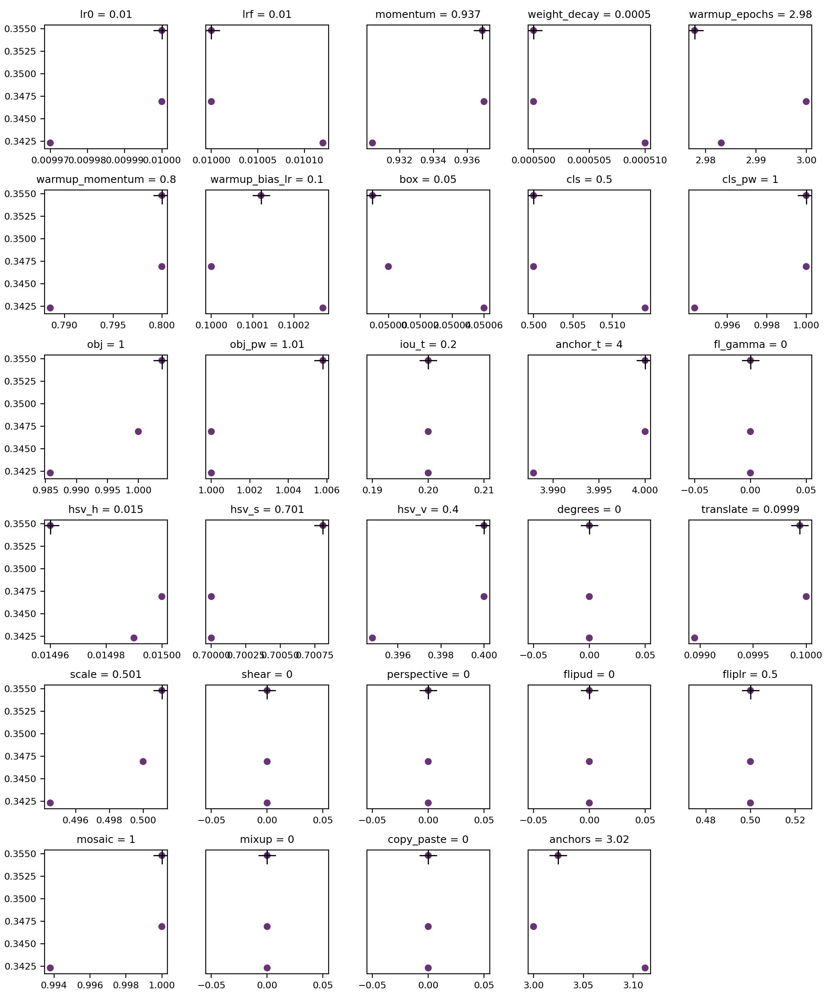

In [48]:
# import numpy as np
# import cv2


# img = cv2.imread('confusion_matrix.png')
# from google.colab.patches import cv2_imshow
# cv2_imshow(img)


from IPython.display import Image
Image('evolve.png')

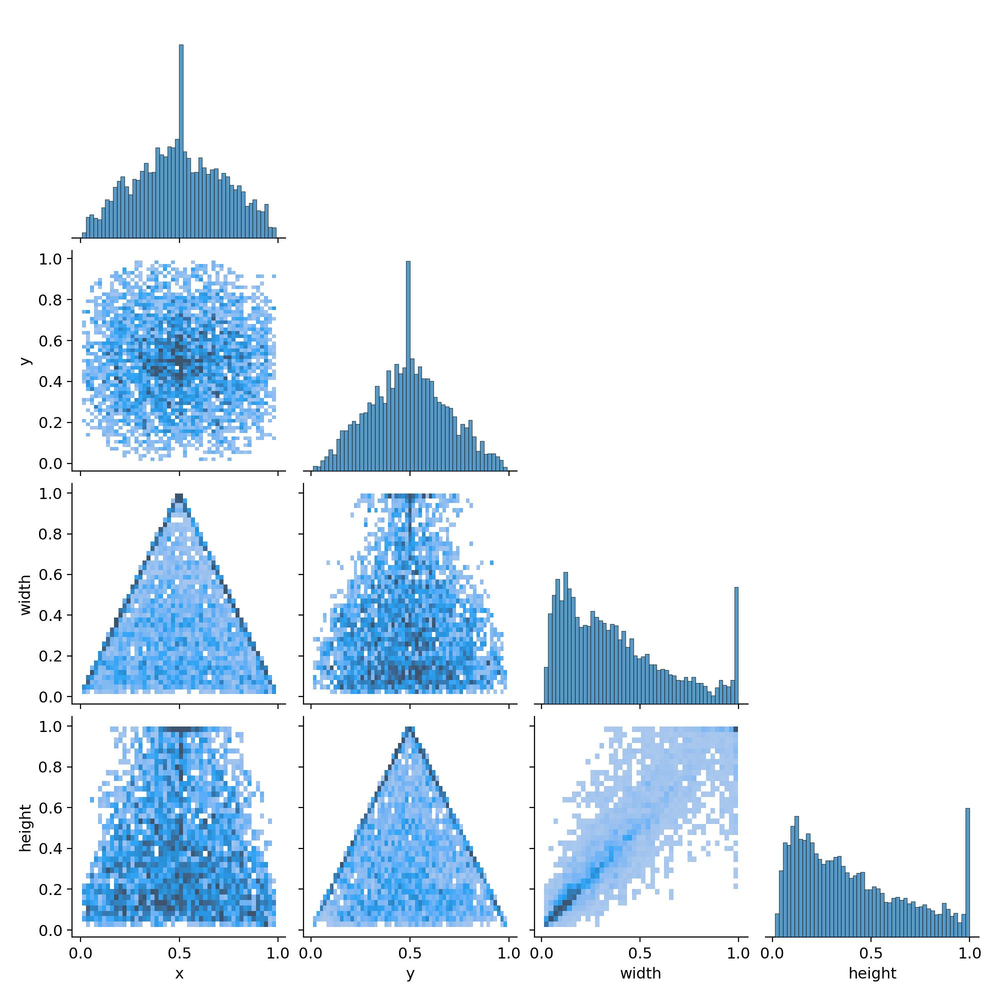

In [49]:

# img = cv2.imread('F1_curve.png')
# cv2_imshow(img)

# import numpy as np
# import cv2


# img = cv2.imread('confusion_matrix.png')
# from google.colab.patches import cv2_imshow
# cv2_imshow(img)


from IPython.display import Image
Image('labels_correlogram.jpg')

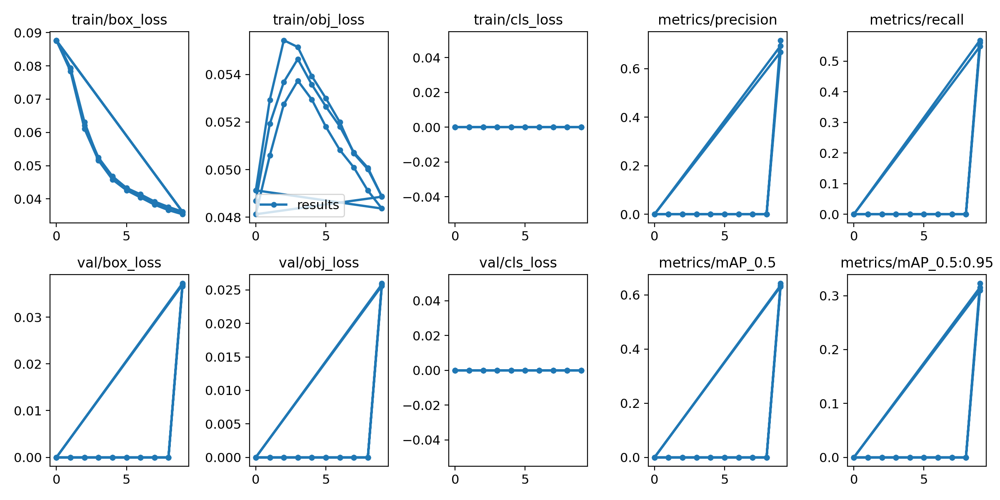

In [50]:

# img = cv2.imread('labels_correlogram.jpg')
# cv2_imshow(img)

from IPython.display import Image
Image('results.png')

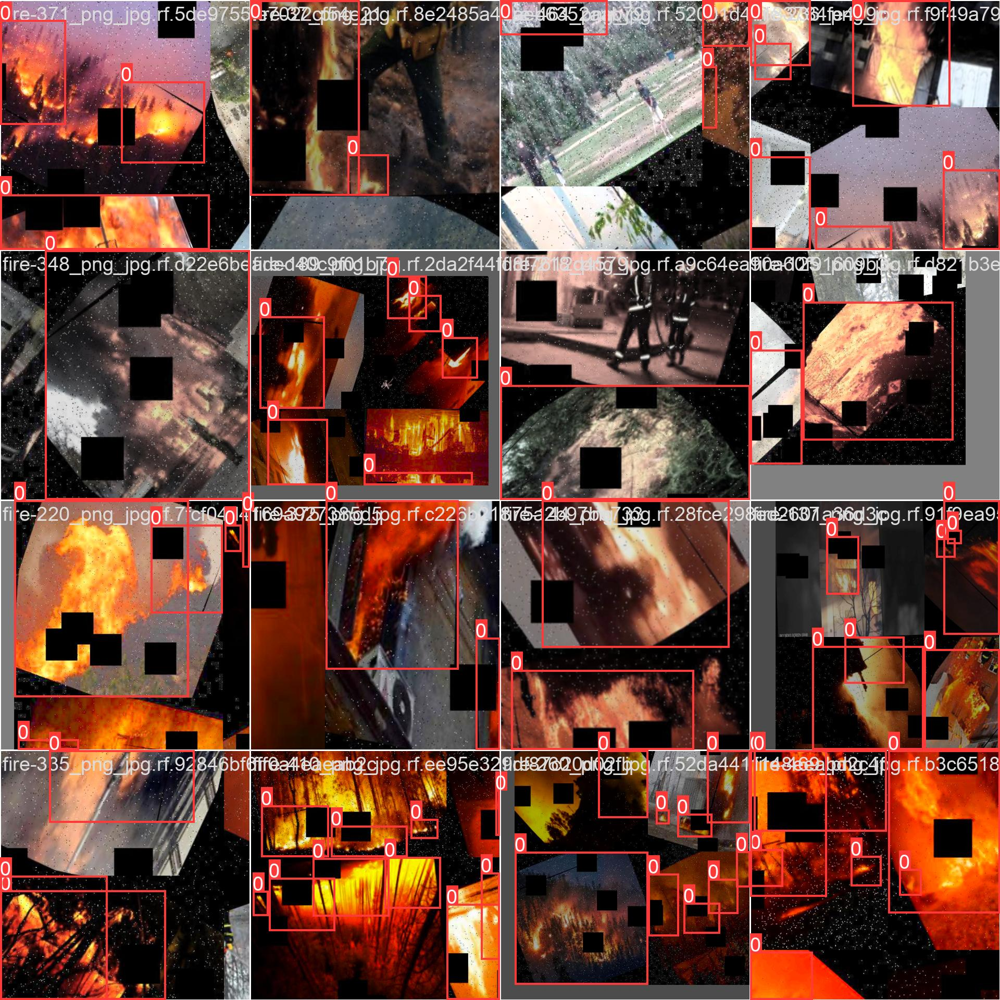

In [51]:

from IPython.display import Image
Image('train_batch0.jpg')

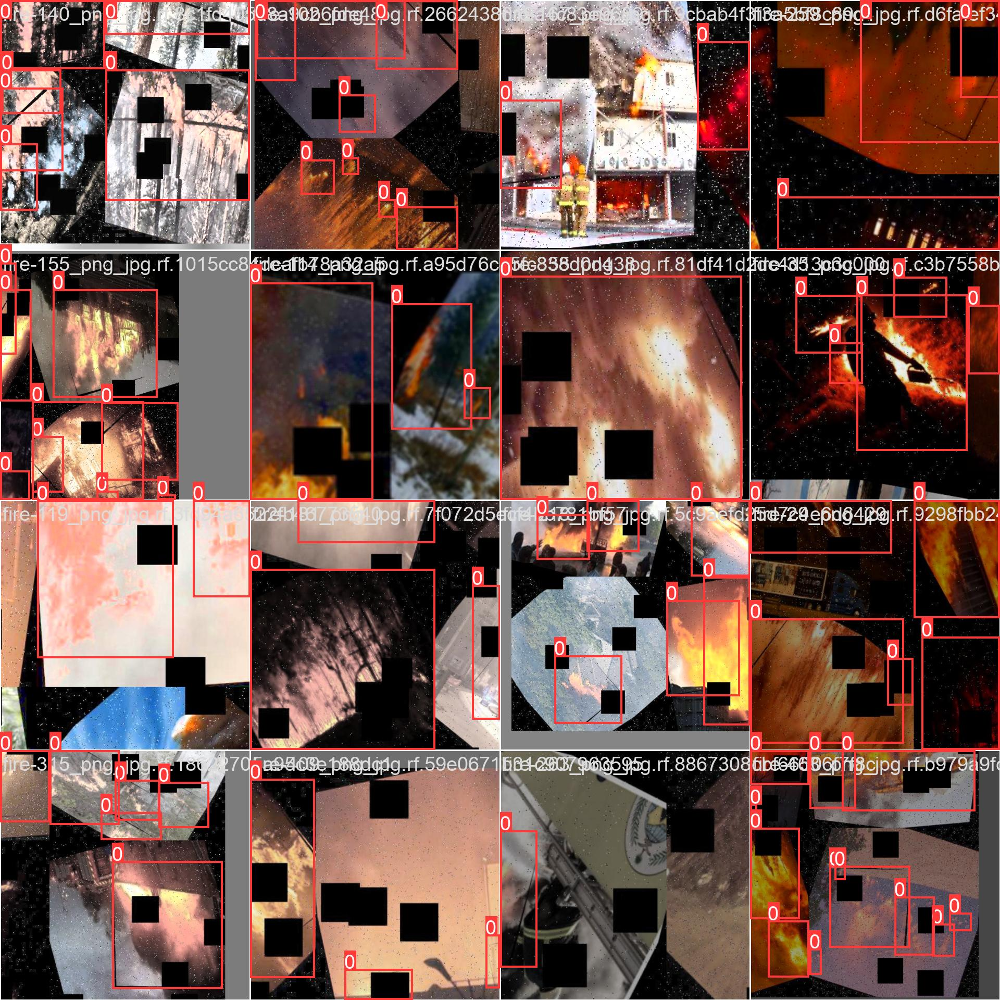

In [52]:

# img = cv2.imread('P_curve.png')
# cv2_imshow(img)

from IPython.display import Image
Image('train_batch1.jpg')

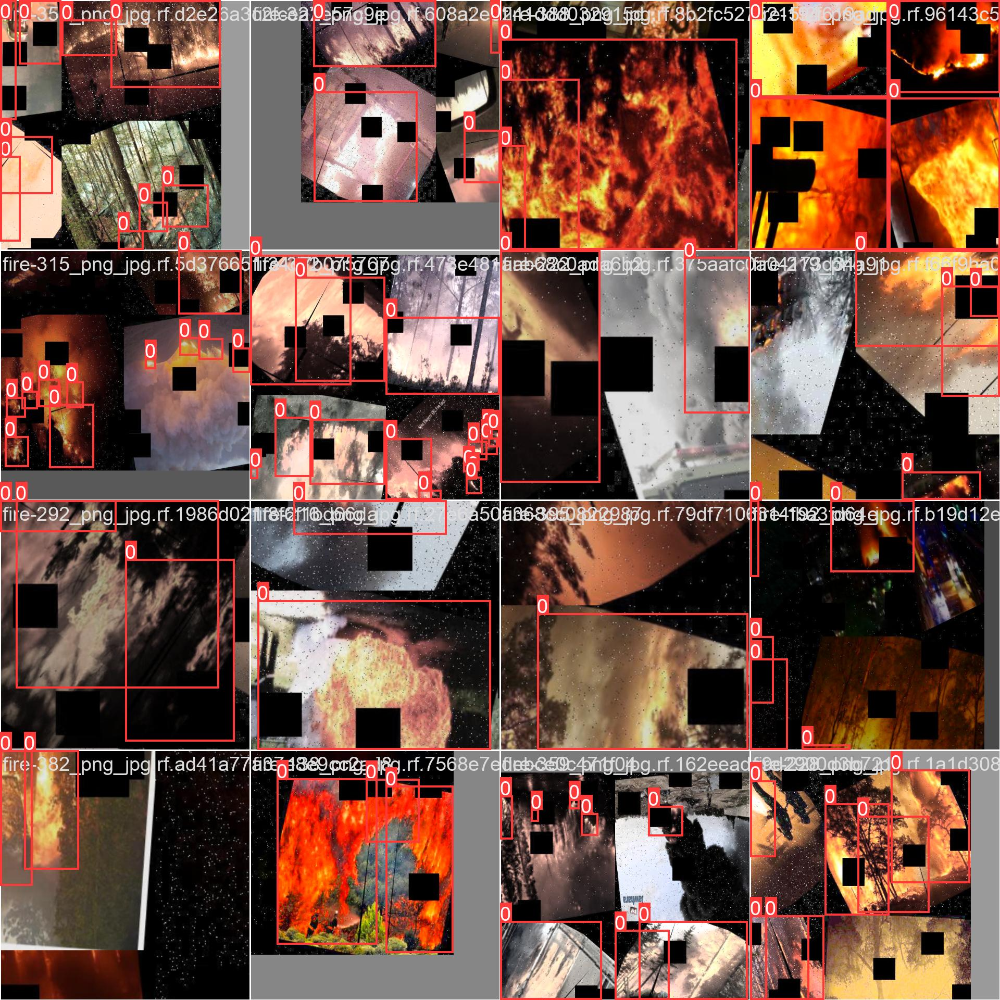

In [53]:

from IPython.display import Image
Image('train_batch2.jpg')

# RGB+INFRARED

In [54]:
%cd /content

/content


In [55]:
!ls

sample_data  yolov5


In [56]:
!rm -rf rgb_infrared

In [57]:

!mkdir rgb_infrared
%cd rgb_infrared
!pwd

/content/rgb_infrared
/content/rgb_infrared


In [58]:
import cv2
import matplotlib.pyplot as plt
import glob
from google.colab import drive

In [59]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5

Cloning into 'yolov5'...
remote: Enumerating objects: 14461, done.
remote: Counting objects: 100% (90/90), done.
remote: Compressing objects: 100% (49/49), done.
remote: Total 14461 (delta 58), reused 63 (delta 40), pack-reused 14371
Receiving objects: 100% (14461/14461), 13.63 MiB | 35.16 MiB/s, done.
Resolving deltas: 100% (9952/9952), done.
/content/rgb_infrared/yolov5


In [60]:
#V2
!curl -L "https://app.roboflow.com/ds/lKOnuCwhuN?key=w4D87x46sd" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# Already downloaded this dataset
!curl -L "https://universe.roboflow.com/ds/2nNJ36KvT1?key=kLR9mab3AY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

# Thermal Images infrared for fire and smoke (using this dataset to augment with normal images thus learning will be for Infrared + Normal)
!curl -L "https://universe.roboflow.com/ds/PiUp5Cy0YP?key=voAEB9Pbbf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


Streaming output truncated to the last 5000 lines.
 extracting: train/labels/fire-418_png_jpg.rf.8c13b15ab532bc7d44788015f87242dd.txt  
 extracting: train/labels/fire-418_png_jpg.rf.9003110a3f6a9f27e3afcf52bb48ddb7.txt  
 extracting: train/labels/fire-418_png_jpg.rf.94b68f7b5806df40ca7f89e0e76a333e.txt  
 extracting: train/labels/fire-418_png_jpg.rf.a95eb79134ad994730b981d2dd52e60b.txt  
 extracting: train/labels/fire-418_png_jpg.rf.a9f2453dc33bd4d514de5b73cc6555fb.txt  
 extracting: train/labels/fire-418_png_jpg.rf.ac3b7bf819a4a430785c86c3d17f307e.txt  
 extracting: train/labels/fire-418_png_jpg.rf.acc8b47e8627414a3e1873fda958a212.txt  
 extracting: train/labels/fire-418_png_jpg.rf.bdd8efa0bfb3775cad52ebc1e7ab48f8.txt  
 extracting: train/labels/fire-418_png_jpg.rf.c2ab458cb19b32e3fa126f9019756872.txt  
 extracting: train/labels/fire-418_png_jpg.rf.c333dab688665134d3e8ba89d9843f8a.txt  
 extracting: train/labels/fire-418_png_jpg.rf.cd6ad741d931a892008d091316f9aee7.txt  
 extracting: t

In [61]:
!pwd

/content/rgb_infrared/yolov5


In [62]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [63]:
%cat data.yaml

train: ../train/images
val: ../valid/images

nc: 1
names: ['Foc']

In [64]:
# define number of classes based on YAML
# data.yaml contains the information about number of classes and their labels required for this project
import yaml
with open("data.yaml", 'r') as stream:
    num_classes = str(yaml.safe_load(stream)['nc'])

In [65]:
#customize iPython writefile so we can write variables
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line, cell):
    with open(line, 'w') as f:
        f.write(cell.format(**globals()))

In [66]:
# Below we are changing the data configuration for right path to the dataset
%%writetemplate data.yaml

train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']

In [67]:

%cat data.yaml


train: ./train/images
val: ./valid/images

nc: 1
names: ['fire']


In [68]:
with open(r'data.yaml') as file:
    # The FullLoader parameter handles the conversion from YAML
    # scalar values to Python the dictionary format
    labels_list = yaml.load(file, Loader=yaml.FullLoader)

    label_names = labels_list['names']

In [69]:
print("Number of Classes are {}, whose labels are {} for this Object Detection project".format(num_classes,label_names))


Number of Classes are 1, whose labels are ['fire'] for this Object Detection project


In [70]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [71]:
#this is the model configuration we will use for our tutorial 
# yolov5s.yaml contains the configuration of neural network required for training.
# /content/gdrive/MyDrive/Rachana_Bhankur/yolo_v5_project/yolov5_new/src/yolov5/data.yaml
# %cat /content/gdrive/MyDrive/yolov5_new/src/yolov5/models/yolov5s.yaml
%cat models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [72]:
!ls

benchmarks.py	 export.py	      README.zh-CN.md	tutorial.ipynb
CITATION.cff	 hubconf.py	      requirements.txt	utils
classify	 LICENSE	      segment		valid
CONTRIBUTING.md  models		      setup.cfg		val.py
data		 README.dataset.txt   test
data.yaml	 README.md	      train
detect.py	 README.roboflow.txt  train.py


In [73]:
%cd models

/content/rgb_infrared/yolov5/models


In [74]:
!ls

common.py	 hub	      segment  yolo.py	     yolov5m.yaml  yolov5s.yaml
experimental.py  __init__.py  tf.py    yolov5l.yaml  yolov5n.yaml  yolov5x.yaml


In [75]:
# skip this if you have already downloaded the file (best parameters)
!wget https://github.com/nv-thang/Forest-Fire-Detection-YOLOv5/raw/main/models/best.pt

--2022-12-12 01:43:45--  https://github.com/nv-thang/Forest-Fire-Detection-YOLOv5/raw/main/models/best.pt
Resolving github.com (github.com)... 140.82.112.4
Connecting to github.com (github.com)|140.82.112.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/nv-thang/Forest-Fire-Detection-YOLOv5/main/models/best.pt [following]
--2022-12-12 01:43:45--  https://raw.githubusercontent.com/nv-thang/Forest-Fire-Detection-YOLOv5/main/models/best.pt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.109.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 14813389 (14M) [application/octet-stream]
Saving to: ‘best.pt’

best.pt             100%[===================>]  14.13M  --.-KB/s    in 0.1s    

2022-12-12 01:43:45 (124 MB/s) - ‘best.pt’ saved [14813389/14813389]

In [76]:
%cd ..

/content/rgb_infrared/yolov5


In [77]:
!pwd

/content/rgb_infrared/yolov5


In [78]:
%%time

!python train.py --evolve 5 --img 240 --batch 160 --epochs 10 --data './data.yaml' --cfg ./models/yolov5s.yaml --weights ''

train: weights=, cfg=./models/yolov5s.yaml, data=./data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=160, imgsz=240, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=5, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-30-g342fe05 Python-3.8.16 torch-1.13.0+cu116 CUDA:0 (A100-SXM4-40GB, 40536MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.

In [79]:
# Finding the dataset size

!pwd

/content/rgb_infrared/yolov5


In [80]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [81]:
import os

print(len(os.listdir('train/images/')))

14583


In [82]:
import os

print(len(os.listdir('test/images/')))

692


In [83]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [84]:
!pwd

/content/rgb_infrared/yolov5


In [85]:
!ls

benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


Evaluate Custom YOLOv5 Detector Performance
Training losses and performance metrics are saved to Tensorboard and also to a logfile defined above with the --name flag when we train. In our case, we named this yolov5s_results. (If given no name, it defaults to results.txt.) The results file is plotted as a png after training completes.

Partially completed results.txt files can be plotted with from utils.utils import plot_results; plot_results()

In [104]:
# Start tensorboard
# Launch after you have started training to all the graphs needed for inspection
# logs save in the folder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

Output hidden; open in https://colab.research.google.com to view.

Curious? Visualize Our Training Data with Labels
After training starts, view train*.jpg images to see training images, labels and augmentation effects.

Note a mosaic dataloader is used for training (shown below), a new dataloading concept developed by Glenn Jocher and first featured in YOLOv4.

In [87]:
# Please look to the new notebook for visuals!

In [88]:
!pwd

!ls

/content/rgb_infrared/yolov5
benchmarks.py	 detect.py    README.dataset.txt   segment	   utils
CITATION.cff	 export.py    README.md		   setup.cfg	   valid
classify	 hubconf.py   README.roboflow.txt  test		   val.py
CONTRIBUTING.md  LICENSE      README.zh-CN.md	   train
data		 models       requirements.txt	   train.py
data.yaml	 __pycache__  runs		   tutorial.ipynb


In [89]:
%cd runs

/content/rgb_infrared/yolov5/runs


In [90]:
!ls

evolve


In [91]:
%cd train

[Errno 2] No such file or directory: 'train'
/content/rgb_infrared/yolov5/runs


In [92]:
!ls

evolve


In [93]:
!ls

evolve


In [94]:
%cd evolve

/content/rgb_infrared/yolov5/runs/evolve


In [95]:
!ls

exp


In [96]:
%cd exp

/content/rgb_infrared/yolov5/runs/evolve/exp


In [97]:
!ls

evolve.csv	 labels_correlogram.jpg  results.png	   train_batch2.jpg
evolve.png	 labels.jpg		 train_batch0.jpg
hyp_evolve.yaml  results.csv		 train_batch1.jpg


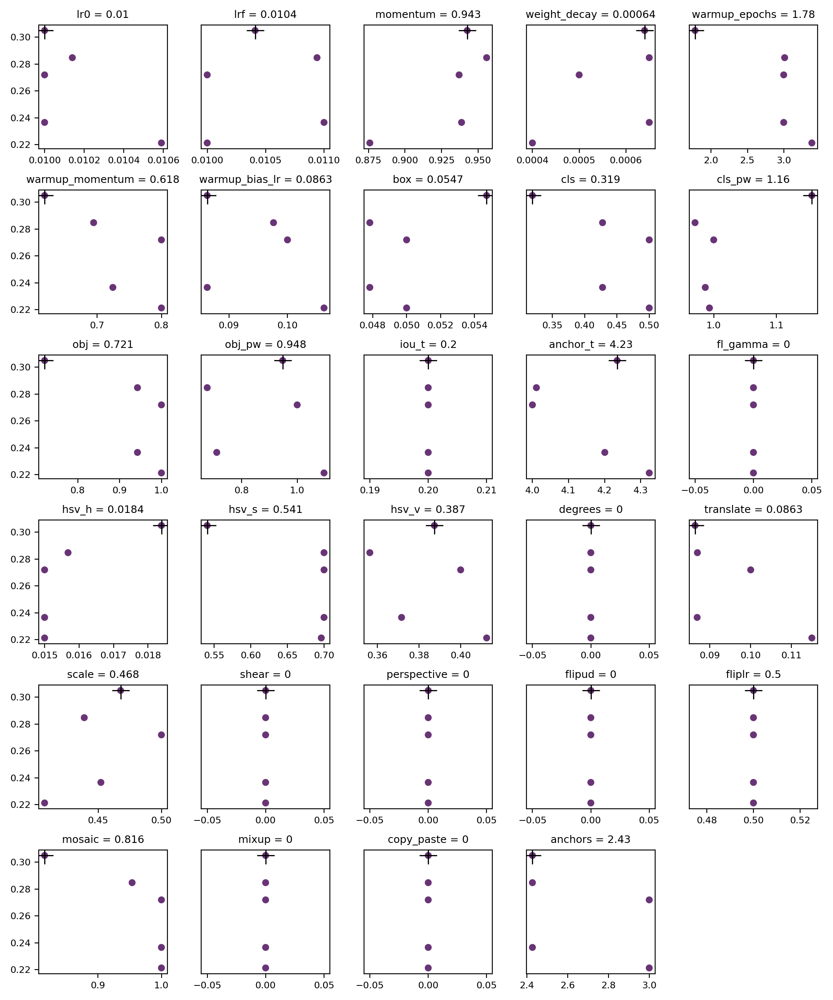

In [98]:
# import numpy as np
# import cv2


# img = cv2.imread('confusion_matrix.png')
# from google.colab.patches import cv2_imshow
# cv2_imshow(img)


from IPython.display import Image
Image('evolve.png')

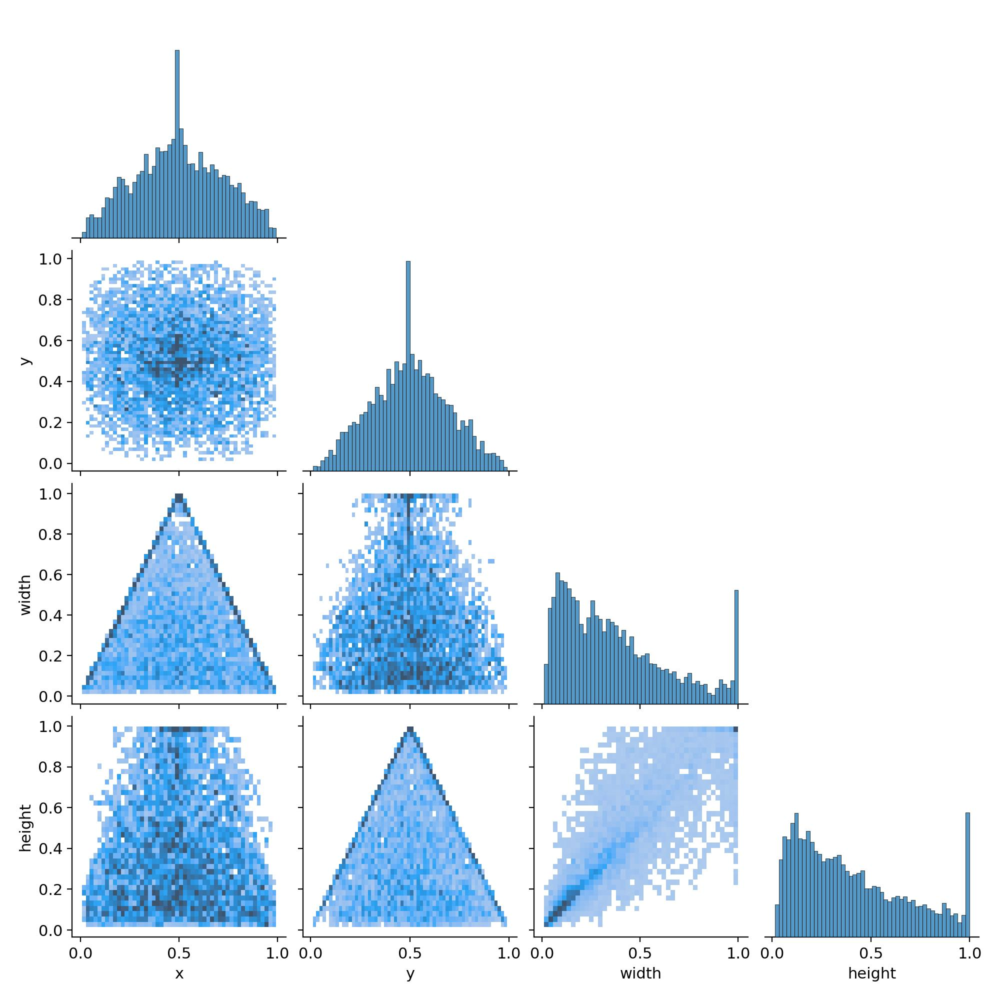

In [99]:

# img = cv2.imread('F1_curve.png')
# cv2_imshow(img)

# import numpy as np
# import cv2


# img = cv2.imread('confusion_matrix.png')
# from google.colab.patches import cv2_imshow
# cv2_imshow(img)


from IPython.display import Image
Image('labels_correlogram.jpg')

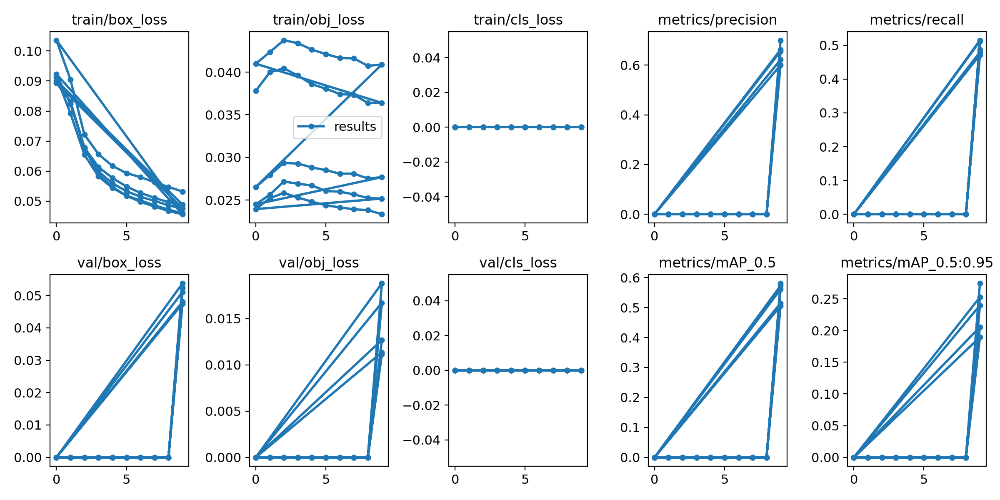

In [100]:

# img = cv2.imread('labels_correlogram.jpg')
# cv2_imshow(img)

from IPython.display import Image
Image('results.png')

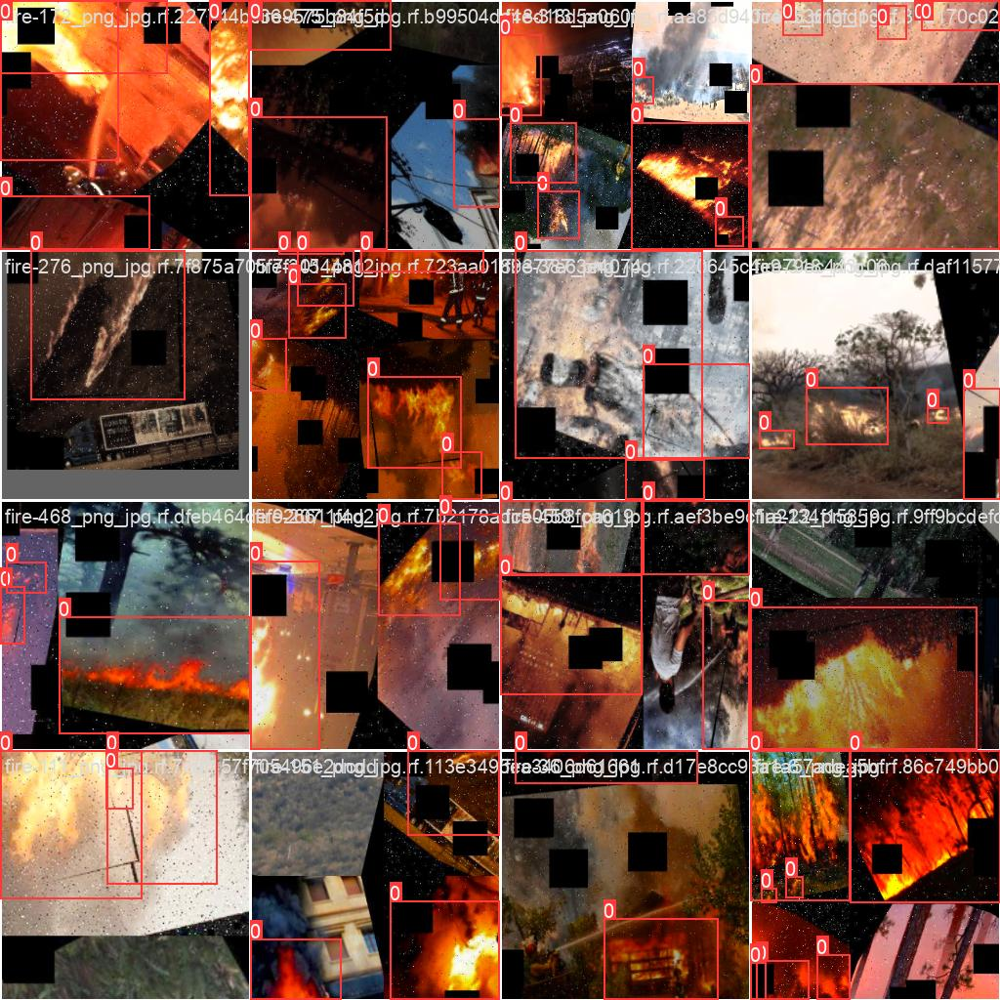

In [101]:

from IPython.display import Image
Image('train_batch0.jpg')

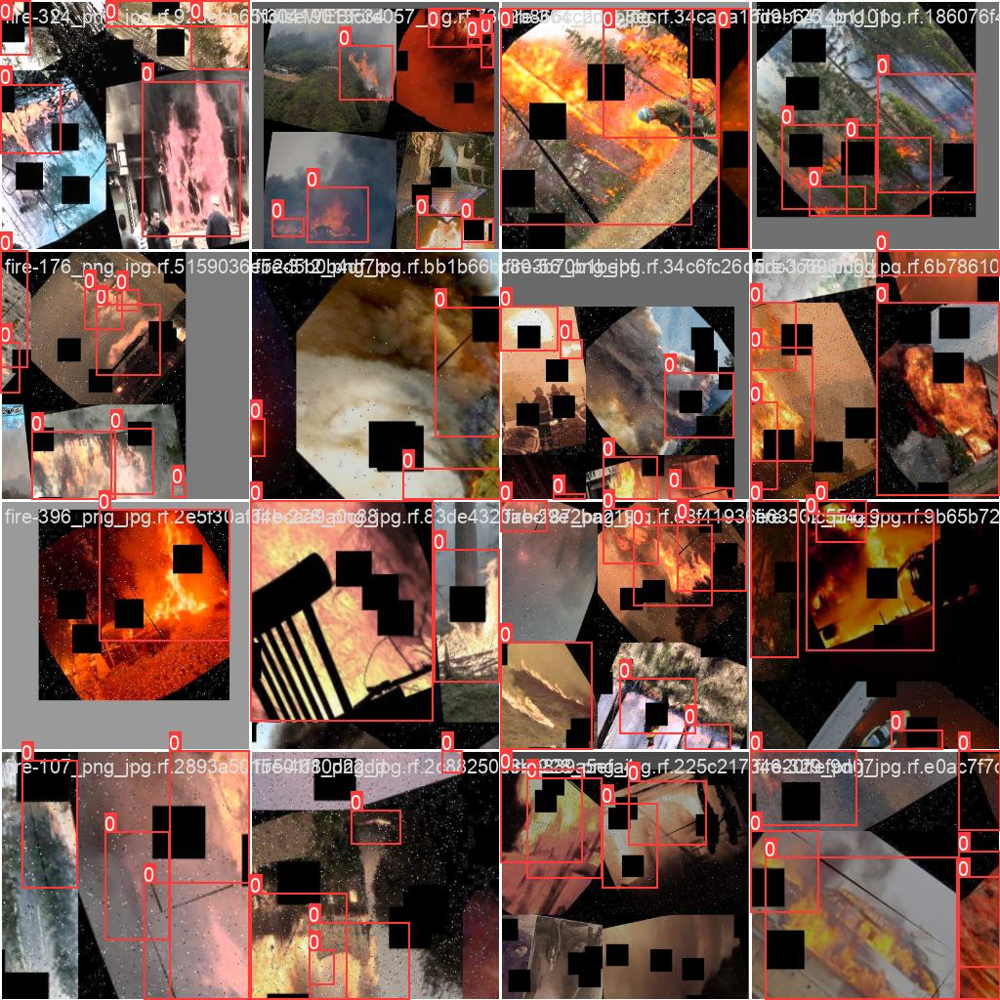

In [102]:

# img = cv2.imread('P_curve.png')
# cv2_imshow(img)

from IPython.display import Image
Image('train_batch1.jpg')

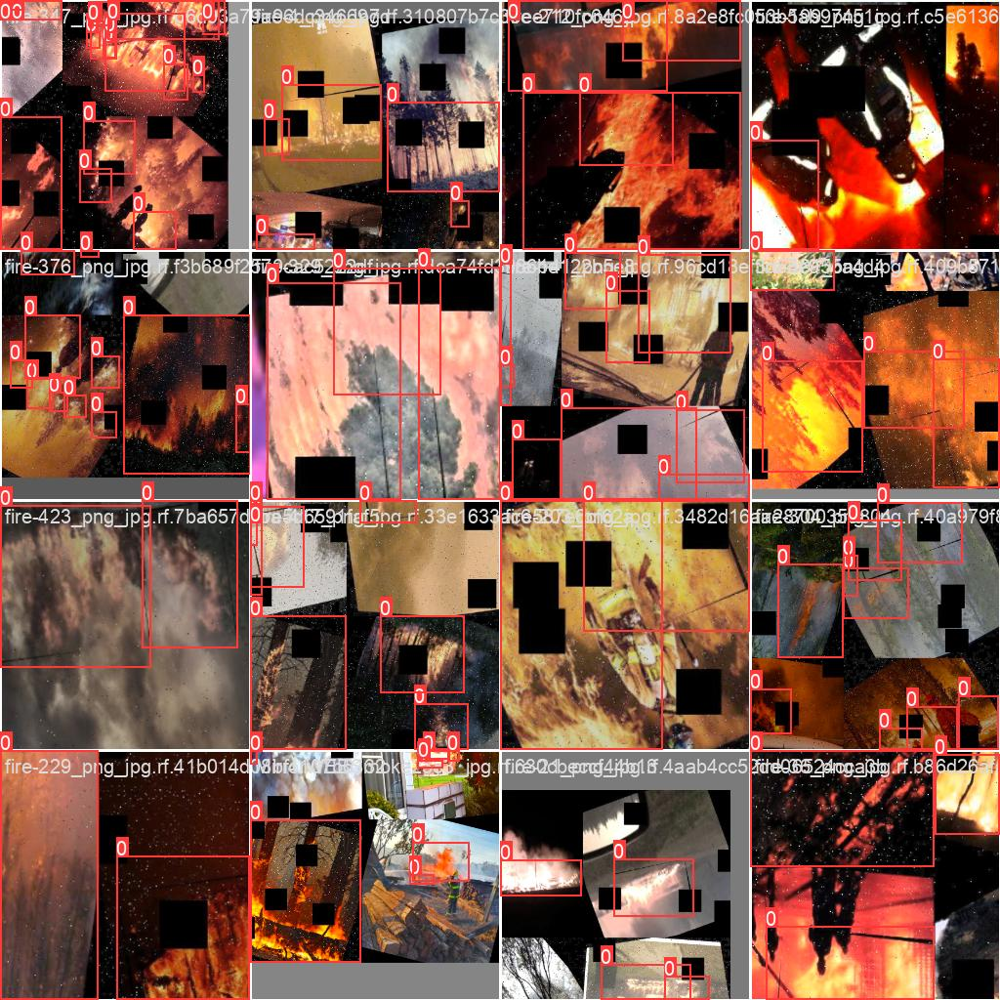

In [103]:

from IPython.display import Image
Image('train_batch2.jpg')

# Changing Hyperparameters:

- Learning rate

- Batch

- Image scaling